In [2]:
import torch
import torch.nn as nn
import numpy as np

In [6]:
class ThreeDHeat_PINN(nn.Module):
    def __init__(self):
      super().__init__()
      self.layers = nn.Sequential(
          nn.Linear(4,100), #x,y,z,t
          nn.Tanh(),
          nn.Linear(100,100),
          nn.Tanh(),
          nn.Linear(100,1)
      )
    def forward(self,x,y,z,t):
      input = torch.cat([x,y,z,t],1) #combines it such that it is like [[x1,t1],[x2,t2]]
      return self.layers(input)


In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [9]:
def get_internal_points(N,t_max):
  #limit it to (N_x,N_t) grid of values
  x = torch.rand(N,1).to(device)
  y = torch.rand(N,1).to(device)
  z = torch.rand(N,1).to(device)
  t = torch.rand(N,1).to(device)*t_max
  return x.requires_grad_(True),y.requires_grad_(True),z.requires_grad_(True),t.requires_grad_(True) #turn on require grad so we can use autograd

def get_initial_points(N):
  x = torch.linspace(0,1,N)
  y = torch.linspace(0,1,N)
  z = torch.linspace(0,1,N)

  x,y,z = torch.meshgrid(x,y,z)
  x=x.reshape(-1,1).to(device) #.reshape(-1,1) turns 1d vector in 2d column vector (N_x,1)
  y=y.reshape(-1,1).to(device)
  z=z.reshape(-1,1).to(device)
  t = torch.zeros_like(x).to(device)
  #initial distribution of x when t is 0
  u = ini_func(x,y,z)
  return x,y,z,t,u

def get_boundary_points(N_t,t_max):
  t = torch.linspace(0,t_max,N_t).to(device)
  x=torch.linspace(0,1,N_t).to(device)
  y=torch.linspace(0,1,N_t).to(device)
  z=torch.linspace(0,1,N_t).to(device)


  #return x0,t,u0,x1,t,u1 #return two sets of boundary conditions (for x0 and x1)
  #return (x0,y,z,t,zeroes),(x1,y,z,t,zeroes),(x,y0,z,t,zeroes),(x,y1,z,t,zeroes),(x,y,z0,t,zeroes),(x,y,z1,t,zeroes) #check this !!

  bc = []
  #capitals are the "meshgridded" version
  Y,Z,T = torch.meshgrid(y,z,t) #generate over 2d yz plane in the 3d surface as well as time
  Y=Y.reshape(-1,1).to(device)
  Z=Z.reshape(-1,1).to(device)
  T=T.reshape(-1,1).to(device)
  zeroes = torch.ones_like(T).to(device)
  x0 = torch.zeros_like(T).to(device)
  x1 = torch.ones_like(T).to(device)
  bc.append((x0,Y,Z,T,zeroes))
  bc.append((x1,Y,Z,T,zeroes))

  X,Z,T = torch.meshgrid(x,z,t)
  X=X.reshape(-1,1).to(device)
  Z=Z.reshape(-1,1).to(device)
  T=T.reshape(-1,1).to(device)
  zeroes = torch.ones_like(T).to(device)
  y0 = torch.zeros_like(T).to(device)
  y1 = torch.ones_like(T).to(device)
  bc.append((X,y0,Z,T,zeroes))
  bc.append((X,y1,Z,T,zeroes))

  X,Y,T = torch.meshgrid(x,y,t)
  X=X.reshape(-1,1).to(device)
  Y=Y.reshape(-1,1).to(device)
  T=T.reshape(-1,1).to(device)
  zeroes = torch.ones_like(T).to(device)
  z0 = torch.zeros_like(T).to(device)
  z1 = torch.ones_like(T).to(device)
  bc.append((X,Y,z0,T,zeroes))
  bc.append((X,Y,z1,T,zeroes))

  return bc


def ini_func(x,y,z):
  #step boundary condition
  x0 = .5
  y0 =.5
  z0 =.5
  #return torch.where(x==x0 and y==y0 and z==z0,[1],[0]) #check this??? i want it to return [[0,0,...1,0,0]]
  mask = (torch.abs(x - x0) < .1) & (torch.abs(y - y0) < .1) & (torch.abs(z - z0) < .1) #will return 3 column vectors full of 0s and 1s that have undergone bitwise AND
  #smooth blob
  return mask.float()
  #return torch.exp(-10*((x-0.5)**2 + (y-0.5)**2 + (z-0.5)**2))

def DE_residual(x,t,u,alpha = 1):
  u_t = torch.autograd.grad(u,t,torch.ones_like(u),create_graph=True)[0]

  u_x = torch.autograd.grad(u,x,torch.ones_like(u),create_graph=True)[0]
  u_x_x = torch.autograd.grad(u_x,x,torch.ones_like(u_x),create_graph=True)[0]
  u_y = torch.autograd.grad(u,y,torch.ones_like(u),create_graph=True)[0]
  u_y_y = torch.autograd.grad(u_y,y,torch.ones_like(u_y),create_graph=True)[0]
  u_z = torch.autograd.grad(u,z,torch.ones_like(u),create_graph=True)[0]
  u_z_z = torch.autograd.grad(u_z,z,torch.ones_like(u_z),create_graph=True)[0]

  return u_t - alpha*(u_x_x+u_y_y+u_z_z)

In [10]:
#train
model = ThreeDHeat_PINN().to(device)
loss = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
alpha = .1
N=500
for epoch in range(N):
  optimizer.zero_grad()

  x,y,z,t = get_internal_points(500,1)
  #print(x.shape,t.shape)
  u = model(x,y,z,t) #shape of [1,N]
  #u_t = torch.autograd.grad(u, t, torch.ones_like(u), create_graph=True)[0]
  #print(u_t.mean(), u_t.std()) is approaching 0

  loss_residual = torch.mean(DE_residual(x,t,u,alpha)**2)
  #print(loss_residual)
  n_points = 100
  x0,y0,z0,t0,u0 = get_initial_points(n_points)
  u0_pred = model(x0,y0,z0,t0)
  if epoch%50==0:
    print(torch.max(u0_pred))
  #loss_ini = loss(u0_pred,u0) #both u0_pred and u0 are column vectors?
  #get the center and weight that more
  center = (n_points**3) //2 + (n_points**2)//2 + n_points//2
  center_loss = u0_pred[center][0] - u0[center][0]
  beta = .8
  loss_ini = beta*center_loss**2 + (1-beta)*loss(u0_pred,u0) #weight the center loss more

  x0p,x1p,y0p,y1p,z0p,z1p = get_boundary_points(100,1)
  xb0,ybx0,zbx0,tbx0,ubx0 = x0p
  xb1,ybx1,zbx1,tbx1,ubx1 = x1p
  ubx0_pred = model(xb0,ybx0,zbx0,tbx0)
  ubx1_pred = model(xb1,ybx1,zbx1,tbx1)
  loss_bx0 = loss(ubx0_pred,ubx0)
  loss_bx1 = loss(ubx1_pred,ubx1)

  xby0,yby0,zby0,tby0,uby0 = y0p
  xby1,yby1,zby1,tby1,uby1 = y1p
  uby0_pred = model(xby0,yby0,zby0,tby0)
  uby1_pred = model(xby1,yby1,zby1,tby1)
  loss_by0 = loss(uby0_pred,uby0)
  loss_by1 = loss(uby1_pred,uby1)

  xbz0,ybz0,zbz0,tbz0,ubz0 = z0p
  xbz1,ybz1,zbz1,tbz1,ubz1 = z1p
  ubz0_pred = model(xbz0,ybz0,zbz0,tbz0)
  ubz1_pred = model(xbz1,ybz1,zbz1,tbz1)
  loss_bz0 = loss(ubz0_pred,ubz0)
  loss_bz1 = loss(ubz1_pred,ubz1)
  loss_b = loss_bx0 + loss_by0 + loss_bz0 + loss_bx1 + loss_by1 + loss_bz1

  loss_total = 10*loss_residual + 100*loss_ini + loss_b
  loss_total.backward()
  optimizer.step()
  if epoch%100==0:
    print(f"Epoch: {epoch} Loss: {loss_total} Residual Loss: {loss_residual} Initial Loss: {loss_ini}")

/usr/local/lib/python3.11/dist-packages/torch/autograd/graph.py:823: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at /pytorch/aten/src/ATen/cuda/CublasHandlePool.cpp:180.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.11/dist-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


tensor(0.3600, device='cuda:0', grad_fn=<MaxBackward1>)
Epoch: 0 Loss: 50.91435241699219 Residual Loss: 0.006335243117064238 Initial Loss: 0.4694465398788452
tensor(0.8912, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.8319, device='cuda:0', grad_fn=<MaxBackward1>)
Epoch: 100 Loss: 15.561270713806152 Residual Loss: 0.004397341050207615 Initial Loss: 0.15274403989315033
tensor(0.8325, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.8334, device='cuda:0', grad_fn=<MaxBackward1>)
Epoch: 200 Loss: 15.079578399658203 Residual Loss: 0.005711856298148632 Initial Loss: 0.14694833755493164
tensor(0.8394, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.8542, device='cuda:0', grad_fn=<MaxBackward1>)
Epoch: 300 Loss: 13.28262996673584 Residual Loss: 0.016045089811086655 Initial Loss: 0.12332398444414139
tensor(0.8796, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.9091, device='cuda:0', grad_fn=<MaxBackward1>)
Epoch: 400 Loss: 9.746660232543945 Residual Loss: 0.07046683877706528 Initial

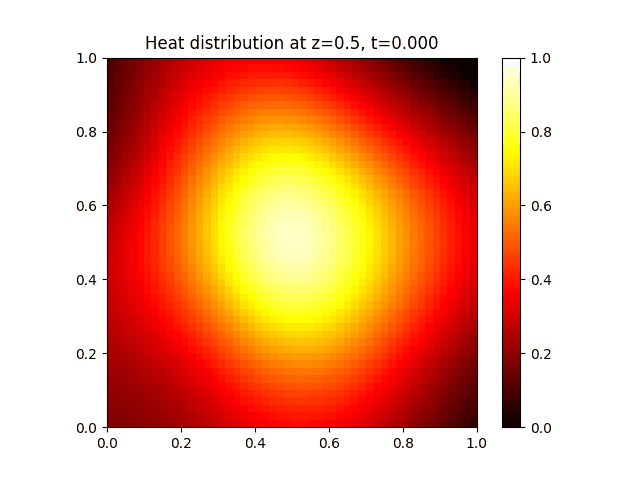

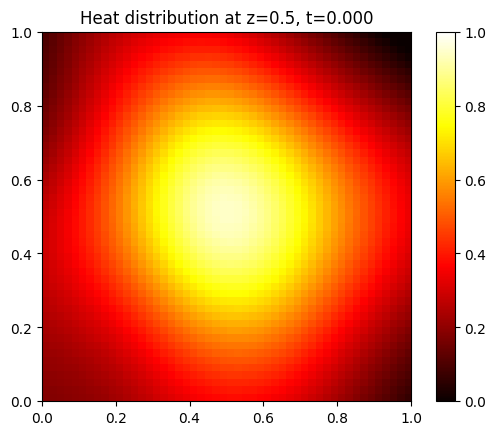

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

def u(x, y, z, t,N):
    #return np.sin(np.pi * x) * np.sin(np.pi * y) * np.sin(np.pi * z) * np.exp(-3 * np.pi**2 * t)
    with torch.no_grad():
      U_tensor = model(x,y,z,t)
      U = U_tensor.view(N, N).cpu().numpy()
      return U #2d for heatmap

# Parameters
N = 50  # spatial resolution
T = 100  # number of time steps
x = np.linspace(0, 1, N)
y = np.linspace(0, 1, N)
X, Y = np.meshgrid(x, y)
X = torch.from_numpy(X).float().flatten().reshape(-1,1).to(device)
Y = torch.from_numpy(Y).float().flatten().reshape(-1,1).to(device)
z_fixed = torch.full_like(X,.5).to(device) # visualize the mid z-slice
times = np.linspace(0, 1, T)  # time points

# Evaluate u for each t
data = []
for t in times:
    t_tensor = torch.full_like(X, t).to(device)
    U = u(X, Y, z_fixed, t_tensor,N)
    data.append(U)

# Setup figure
fig, ax = plt.subplots()
cax = ax.imshow(data[0], extent=[0,1,0,1], origin='lower', cmap='hot', vmin=0, vmax=1)
fig.colorbar(cax)
ax.set_title("Heat distribution at z = 0.5")

def update(frame):
    cax.set_array(data[frame])
    ax.set_title(f"Heat distribution at z=0.5, t={times[frame]:.3f}")
    return [cax]

ani = FuncAnimation(fig, update, frames=T, interval=50, blit=False)
ani.save('heat.gif', writer='pillow')
from IPython.display import Image
Image(filename='heat.gif')


In [14]:
model(torch.tensor([[0.5]]).to(device),torch.tensor([[0.5]]).to(device),torch.tensor([[0.5]]).to(device),torch.tensor([[0]]).to(device))

tensor([[0.4133]], device='cuda:0', grad_fn=<AddmmBackward0>)

In [30]:
x_new = torch.linspace(0,50,50).to(device)
y_new = torch.linspace(0,50,50).to(device)
z_new = torch.linspace(0,50,50).to(device)
x_new,y_new,z_new = torch.meshgrid(x_new,y_new,z_new)
x_new.reshape(-1,1)[50*50*50-1] #

tensor([50.], device='cuda:0')

In [49]:
y_new.reshape(-1,1).shape

torch.Size([125000, 1])

In [1]:
z_new.reshape(-1,1)

NameError: name 'z_new' is not defined

In [33]:
for i in x_new.reshape(-1,1):
  print(i)

Streaming output truncated to the last 5000 lines.
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0')
tensor([1.0204], device='cuda:0

KeyboardInterrupt: 

In [ ]:
#x_new - 0 *2500, 1*2500, ...
#y_new - 0*50, 1*50, 2*50... (50 times) repeats itself
#z_new - 0,1,2...50  (50*50) repeats itself

#x_new[N/2*N^2+N^2/2+N/2]
#y_new[N/2*N^2]

In [48]:
x_new.reshape(-1,1)[25*2500+2500//2+50//2]

tensor([25.5102], device='cuda:0')

In [43]:
z_new.reshape(-1,1)[25*2500+2500//2+50//2]

tensor([25.5102], device='cuda:0')

In [1]:
!pip install plotly

In [22]:
import plotly.graph_objects as go

# Generate grid
N = 20  # resolution
x = y = z = torch.linspace(0, 1, N)
X, Y, Z = torch.meshgrid(x, y, z, indexing='ij')
X = X.flatten().reshape(-1,1).to(device)
Y = Y.flatten().reshape(-1,1).to(device)
Z = Z.flatten().reshape(-1,1).to(device)


# Time steps
time_steps = torch.linspace(0, 1, 20)
frames = []

def u(x, y, z, t,N):
    #return np.sin(np.pi * x) * np.sin(np.pi * y) * np.sin(np.pi * z) * np.exp(-3 * np.pi**2 * t)
    with torch.no_grad():
      U_tensor = model(x,y,z,t)
      U = U_tensor.view(N, N,N).cpu().numpy()
      return U #3d for 3d visual

for t in time_steps:
    U = u(X, Y, Z, torch.full_like(X,t),20)
    U_np = U

    # Create frame (volume rendering)
    frame = go.Frame(
        data=go.Volume(
            x=X.flatten().cpu().numpy(),
            y=Y.flatten().cpu().numpy(),
            z=Z.flatten().cpu().numpy(),
            value=U_np.flatten(),
            opacity=0.1,  # lower opacity for better 3D viewing
            surface_count=12,
            isomin=0,
            isomax=1,
            colorscale='Hot',
        ),
        name=f"t={t:.2f}"
    )
    frames.append(frame)


In [23]:
fig = go.Figure(
    data=frames[0].data,
    layout=go.Layout(
        title="3D Heat Distribution",
        scene=dict(
            xaxis=dict(range=[0, 1]),
            yaxis=dict(range=[0, 1]),
            zaxis=dict(range=[0, 1]),
        ),
        updatemenus=[{
            "type": "buttons",
            "buttons": [{
                "label": "Play",
                "method": "animate",
                "args": [None, {"frame": {"duration": 100, "redraw": True},
                                "fromcurrent": True}]
            }]
        }]
    ),
    frames=frames
)

fig.show()
